## Fazendo rede de classificação com CNN
Neste projeto, dado que preferimos fazer um Image Captioning, a própria arquitetura da rede por si só é uma multimodal, portanto, para fazer o trabalho 1, optamos por alterar o propósito do trabalho.

Assim, vamos transformar o nosso dataset para um de classificação através da extração de palavras chaves e utilizar uma rede para fazer a classificação das imagens. Além disso, usaremos um modelo pretreinado para fazer a embedding das imagens e, a partir das embeddings, ele tentar

In [6]:
import torch.nn as nn
import torch.optim as optim
import torch
from torch.utils.data import DataLoader

from imports.imageDataset import ImageDataset

import matplotlib.pyplot as plt

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [36]:
import torch.nn as nn
import torch.optim as optim
import torch

# Definição de uma CNN simples para classificação em 10 classes
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=10, dropout_conv=0.3, dropout_fc=0.5):
        """
        Args:
            num_classes (int): número de classes na saída.
            dropout_conv (float): probabilidade de dropout após blocos de conv (opcional).
            dropout_fc (float): probabilidade de dropout nas camadas fully-connected.
        """
        super(SimpleCNN, self).__init__()
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(p=dropout_conv)
        )

        self.block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Dropout2d(p=dropout_conv)
        )

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_fc),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.avgpool(x)
        x = self.classifier(x)
        return x

def train(model,optimizer,criterion,train_loader,val_loader,num_epochs=10):
    """
    Executa o treinamento e validação por num_epochs e depois
    retorna 4 listas: train_losses, train_accs, val_losses e val_accs.
    """
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_correct = 0
        running_total = 0

        # Itera sobre batches de treino, sendo que o loader retorna (images, labels, caption)
        for images, labels, _ in train_loader:
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # Acumula loss
            batch_size = images.size(0)
            running_loss += loss.item() * batch_size

            # Acumula acertos para train acc
            _, preds = torch.max(outputs, dim=1)
            running_correct += (preds == labels).sum().item()
            running_total += batch_size


        epoch_train_loss = running_loss / running_total
        epoch_train_acc = running_correct / running_total
        train_losses.append(epoch_train_loss)
        train_accs.append(epoch_train_acc)

        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.4f}")

        ## Etapa de avaliação
        model.eval()
        val_running_loss = 0.0
        val_running_correct = 0
        val_running_total = 0

        with torch.no_grad():
            for images, labels, _ in val_loader:
                images = images.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)

                outputs = model(images)
                loss = criterion(outputs, labels)

                batch_size = images.size(0)
                val_running_loss += loss.item() * batch_size

                _, preds = torch.max(outputs, dim=1)
                val_running_correct += (preds == labels).sum().item()
                val_running_total += batch_size

        epoch_val_loss = val_running_loss / val_running_total
        epoch_val_acc = val_running_correct / val_running_total
        val_losses.append(epoch_val_loss)
        val_accs.append(epoch_val_acc)

        print(f"           Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.4f}")
    return train_losses, train_accs, val_losses, val_accs

def plot_trainval_graphs(train_losses, train_accs, val_losses, val_accs):
  epochs_range = range(1, len(train_losses) + 1)

  plt.figure(figsize=(8, 4))
  plt.plot(epochs_range, train_losses, label='Train Loss')
  plt.plot(epochs_range, val_losses, label='Val Loss')
  plt.xlabel('Época')
  plt.ylabel('Loss')
  plt.title('Loss por Época')
  plt.legend()
  plt.grid(True)
  plt.show()

  plt.figure(figsize=(8, 4))
  plt.plot(epochs_range, train_accs, label='Train Acc')
  plt.plot(epochs_range, val_accs, label='Val Acc')
  plt.xlabel('Época')
  plt.ylabel('Acurácia')
  plt.title('Acurácia por Época')
  plt.legend()
  plt.grid(True)
  plt.show()

In [ ]:
#definindo classes
classes = ['dog','man','woman','child','water','ball','car','snow']
class2label = {classes[i]:i for i in range(len(classes))}
label2class = {i:classes[i] for i in range(len(classes))}

#carregando dataset
whole_train_data = torch.load('./data/processed/train_subset.pt', weights_only=False)
train_dataset, val_dataset= torch.utils.data.random_split(whole_train_data, [0.8, 0.2])

## Fazendo os loaders
batch_size = 32
num_workers = 4

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True,
                          num_workers=num_workers, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True)

Epoch 1/10 - Train Loss: 2.1669, Train Acc: 0.1406
           Val Loss: 2.0870, Val Acc: 0.1812
Epoch 2/10 - Train Loss: 2.0885, Train Acc: 0.1719
           Val Loss: 2.0183, Val Acc: 0.2000
Epoch 3/10 - Train Loss: 2.0696, Train Acc: 0.1953
           Val Loss: 1.9519, Val Acc: 0.2125
Epoch 4/10 - Train Loss: 2.0269, Train Acc: 0.2234
           Val Loss: 1.9331, Val Acc: 0.2313
Epoch 5/10 - Train Loss: 1.9989, Train Acc: 0.2109
           Val Loss: 1.9314, Val Acc: 0.2375
Epoch 6/10 - Train Loss: 2.0022, Train Acc: 0.2281
           Val Loss: 1.9204, Val Acc: 0.2375
Epoch 7/10 - Train Loss: 1.9912, Train Acc: 0.2172
           Val Loss: 1.9040, Val Acc: 0.2812
Epoch 8/10 - Train Loss: 1.9497, Train Acc: 0.2281
           Val Loss: 1.8956, Val Acc: 0.2562
Epoch 9/10 - Train Loss: 1.9669, Train Acc: 0.2297
           Val Loss: 1.9002, Val Acc: 0.3000
Epoch 10/10 - Train Loss: 1.9353, Train Acc: 0.2344
           Val Loss: 1.8990, Val Acc: 0.2562


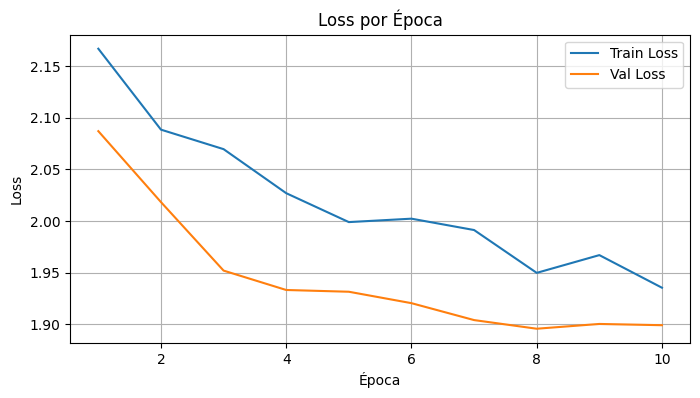

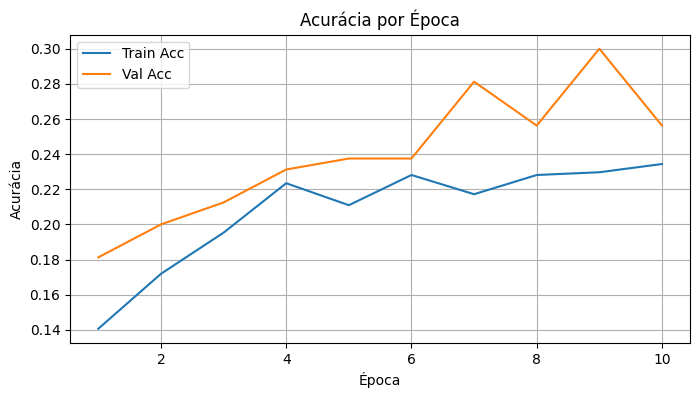

In [ ]:
model = SimpleCNN(num_classes=len(classes)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
num_epochs = 10

train_losses, train_accs, val_losses, val_accs = train(model,optimizer,criterion,train_loader,val_loader,num_epochs)
plot_trainval_graphs(train_losses, train_accs, val_losses, val_accs)

Com o treinamento, analisando os gráficos não parece estar acontecendo um overfitting, mas também deve ser levado em conta que foram muito poucas épocas para ver uma mudança significativa. O modelo foi salvo e será avaliado em outra etapa.

In [ ]:
#torch.save(model, './models/flickrcnn.pt')

In [18]:
import numpy as np
def get_acc_per_class(model,loader):
  acc_count = np.zeros(len(classes)) ## conta casos em que pred==truelabel (acertou predizendo a classe X)
  error_count = np.zeros(len(classes)) ## conta casos em que predizeu X e a classe era Y, nesse caso error_count[X]+=1 (errou predizendo a classe X)
  total_class_count = np.zeros(len(classes))
  with torch.no_grad():
    for images, labels_true, captions in loader:
      images = images.to(device, non_blocking=True)

      outputs = model(images)
      _, preds = torch.max(outputs, dim=1)

      for i,label_true in enumerate(labels_true):
        if int(label_true) == int(preds[i]):
          acc_count[label_true]+=1
        else:
          error_count[int(preds[i])]+=1
        total_class_count[label_true]+=1
    acc_count /= total_class_count
    error_count /= sum(error_count) ## normaliza para todas as predições
  return acc_count,error_count ## (acurácia por classe , proporções de predições feitas erradas por classe)

In [34]:
def plot_acc_per_class(model,loaders:list):
  """
  Plota o gráfico de acurácia por classe para os dados de treino, validação e teste.
  Args:
    loaders (list): lista de loaders (train_loader, val_loader, test_loader)
    dfs (list): lista de dataframes (df_train, df_val, df_test)
  """
  fig,axs = plt.subplots(2,3,figsize=(6*3,4*2))
  plt.title("Acurácia e erro por classe")

  train_acc_perclass,train_error_perclass = get_acc_per_class(model,train_loader)
  ax = axs[0][0]
  ax.set_title("Acertou predizendo [train]")
  ax.bar(np.arange(len(classes)),train_acc_perclass)
  ax.set_ylabel("% de acerto")
  ax.set_xticks(np.arange(len(classes)),classes)
  ax = axs[1][0]
  ax.set_title("Errou predizendo [train]")
  ax.bar(np.arange(len(classes)),train_error_perclass)
  ax.set_ylabel("proporção da predição")
  ax.set_xticks(np.arange(len(classes)),classes)

  val_acc_perclass,val_error_perclass = get_acc_per_class(model,val_loader)
  ax = axs[0][1]
  ax.set_title("Acertou predizendo [val]")
  ax.bar(np.arange(len(classes)),val_acc_perclass)
  ax.set_ylabel("% de acerto")
  ax.set_xticks(np.arange(len(classes)),classes)
  ax = axs[1][1]
  ax.set_title("Errou predizendo [val]")
  ax.bar(np.arange(len(classes)),val_error_perclass)
  ax.set_ylabel("proporção da predição")
  ax.set_xticks(np.arange(len(classes)),classes)

  test_acc_perclass,test_error_perclass = get_acc_per_class(model,test_loader)
  ax = axs[0][2]
  ax.set_title("Acertou predizendo [test]")
  ax.bar(np.arange(len(classes)),test_acc_perclass)
  ax.set_ylabel("% de acerto")
  ax.set_xticks(np.arange(len(classes)),classes)
  ax = axs[1][2]
  ax.set_title("Errou predizendo [test]")
  ax.bar(np.arange(len(classes)),test_error_perclass)
  ax.set_ylabel("proporção da predição")
  ax.set_xticks(np.arange(len(classes)),classes)

  plt.show()

  train_labels = [element[1] for element in train_dataset]
  val_labels = [element[1] for element in train_dataset]
  test_labels = [element[1] for element in train_dataset]

  print("\nQuantidade de labels em cada conjunto: ")
  print("Treino   : ",np.unique(train_labels,return_counts=True))
  print("Validação: ",np.unique(test_labels,return_counts=True))
  print("Teste    : ",np.unique(val_labels,return_counts=True))

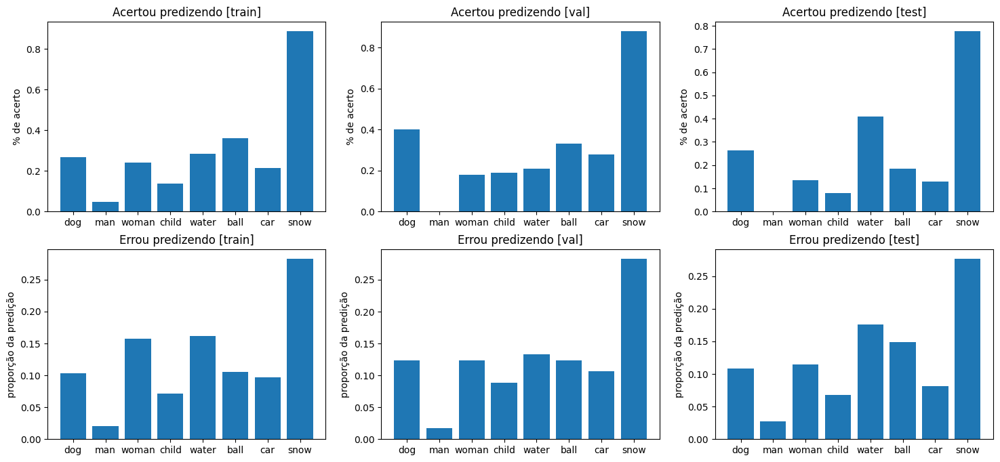


Quantidade de labels em cada conjunto: 
Treino   :  (array([0, 1, 2, 3, 4, 5, 6, 7]), array([71, 86, 75, 79, 84, 80, 84, 81]))
Validação:  (array([0, 1, 2, 3, 4, 5, 6, 7]), array([71, 86, 75, 79, 84, 80, 84, 81]))
Teste    :  (array([0, 1, 2, 3, 4, 5, 6, 7]), array([71, 86, 75, 79, 84, 80, 84, 81]))


In [35]:
plot_acc_per_class(model,(train_loader,val_loader,test_loader))

O modelo está sendo treinado por muito poucas épocas, não é tão potente e não estão sendo feitas técnicas para aumentar a robustez das predições como Data Augmentation, então já era esperado que o modelo não desempenhasse bem. Isso foi praticamente um exemplo didático do funcionamento da cnn.

O dataset é bem complicado, então já é esperado que ele não desempenhe bem, mas aparentemente ele está conseguindo acertar mais da classe 'snow' e 'dog'. Dito isso, vamos tentar usar [Class Activation Map](https://github.com/frgfm/torch-cam) para tentar entender o funcionamento interno da rede.

In [39]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchcam.methods import SmoothGradCAMpp
import numpy as np

def get_cam_img(model,target_layer,input_tensor,threshold=90,alpha = 0.9):
  cam_extractor = SmoothGradCAMpp(model, target_layer=target_layer)
  with torch.enable_grad():
      output = model(input_tensor)
  class_idx = output.squeeze(0).argmax().item()

  activation_maps = cam_extractor(class_idx, output)
  activation_map = activation_maps[0] if isinstance(activation_maps, list) else activation_maps
  if activation_map.ndim == 3 and activation_map.shape[0] == 1:
      activation_map = activation_map.squeeze(0)  # de (1,H,W) para (H,W)

  cam = activation_map.unsqueeze(0).unsqueeze(0)  # (1,1,H,W)
  cam_upsampled = F.interpolate(cam, size=(224,224), mode='bilinear', align_corners=False)
  cam_np = cam_upsampled.squeeze().cpu().detach().numpy()  # (224,224)
  cam_np -= cam_np.min()
  if cam_np.max() > 0:
      cam_np /= cam_np.max()

  img_np = input_tensor.squeeze(0).cpu().detach().numpy().transpose(1,2,0)
  threshold = np.percentile(cam_np, threshold)
  mask = cam_np > threshold

  cmap = plt.cm.viridis
  alpha = np.clip((cam_np - threshold) / (1 - threshold), 0, 1) * 0.6
  heatmap = cmap(cam_np)
  heatmap[..., 3] = mask * alpha
  return img_np,heatmap

## Mostrando por classe como fica a verificação
def get_cams_per_class(model,loader,target_layer,n_perclass = 5,threshold=60,alpha=0.9):
  cam_imgs_per_class = []
  for i in range(len(classes)):
    cam_imgs_per_class.append([])
  loop = True
  loader_iter = iter(loader)
  while loop:
    images_batch, labels_batch, captions_batch = next(loader_iter)
    images_batch = images_batch.to(device, non_blocking=True)
    labels_batch = labels_batch.to(device, non_blocking=True)

    loop = False
    for idx in range(len(images_batch)):
      label = int(labels_batch[idx].cpu())
      if len(cam_imgs_per_class[label]) >= n_perclass: ## já tem o suficiente
        continue

      loop = True
      input_tensor = images_batch[idx].unsqueeze(0).clone().detach().to(device)
      input_tensor.requires_grad_(True)
      caption = captions_batch[idx]
      img_np,heatmap = get_cam_img(model,target_layer,input_tensor,threshold=threshold,alpha = alpha)
      output = model(input_tensor)
      _, pred = torch.max(output, dim=1)
      cam_imgs_per_class[label].append((img_np,heatmap,caption,label,int(pred)))
  return cam_imgs_per_class

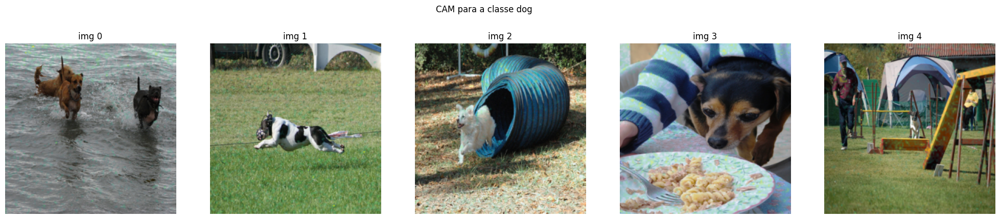

    0 --- true: dog        pred: dog        caption: Three dogs , two brown and one black , run in the surf .
    1 --- true: dog        pred: ball       caption: A black and white dog with a mask on its face is running in a field .
    2 --- true: dog        pred: snow       caption: A white dog runs out of a long blue tube outside .
    3 --- true: dog        pred: snow       caption: A person holding a dog while they eat .
    4 --- true: dog        pred: ball       caption: A dog goes through an obstacle course while his owner runs beside him .





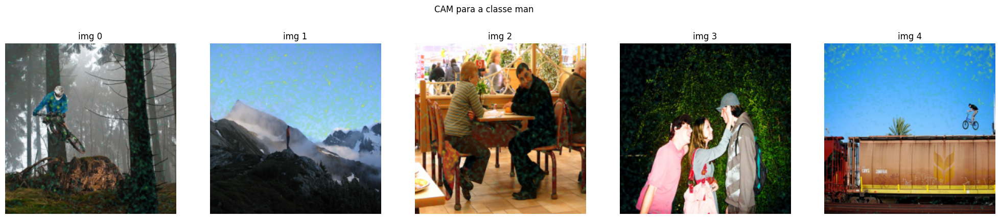

    0 --- true: man        pred: water      caption: A man in blue jumps his dirt bike in a misty forest .
    1 --- true: man        pred: snow       caption: Man standing at the top of a mountain at dusk .
    2 --- true: man        pred: man        caption: A man and woman sit at a table in a restaurant .
    3 --- true: man        pred: woman      caption: Girl touches young man 's face as young man in pink shirt observes , leafy background .
    4 --- true: man        pred: water      caption: A man jumps train cars with his bike .





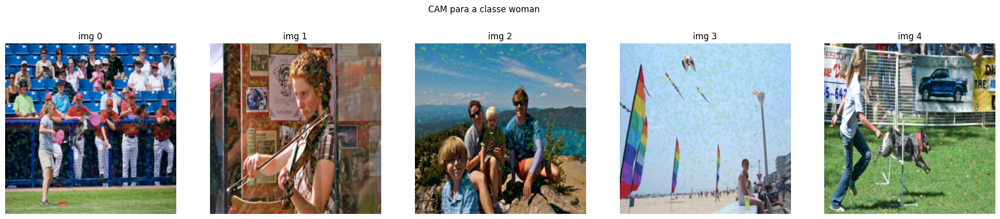

    0 --- true: woman      pred: woman      caption: A woman is using Frisbees to play with a dog in front of a stadium crowd and a group of baseball players .
    1 --- true: woman      pred: man        caption: The woman is holding a violin .
    2 --- true: woman      pred: water      caption: A family of two young boys and a woman and man pose in front of a scenic background .
    3 --- true: woman      pred: snow       caption: Woman at kite festival on boardwalk
    4 --- true: woman      pred: ball       caption: A woman runs alongside her dog as he jumps a hurdle .





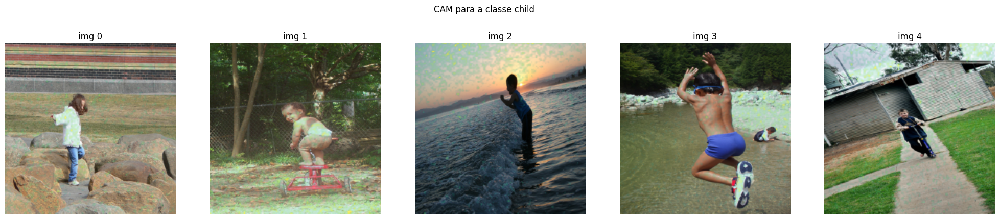

    0 --- true: child      pred: dog        caption: A child walking on rocks .
    1 --- true: child      pred: dog        caption: The child stand on the seat of his trike in the park .
    2 --- true: child      pred: snow       caption: A child stands in front of an incoming wave as the sun sets .
    3 --- true: child      pred: dog        caption: A child jumping into a lake in a wooded area while another child plays on the shore .
    4 --- true: child      pred: dog        caption: A child on a scooter moving down the sidewalk .





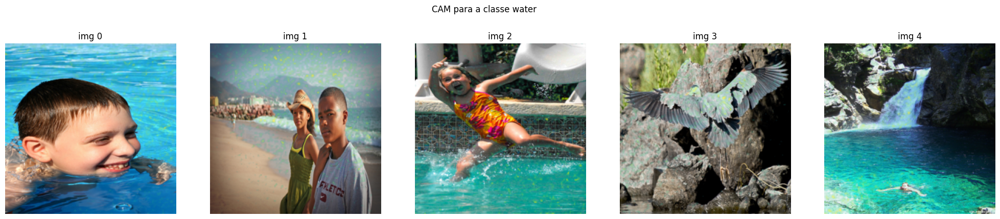

    0 --- true: water      pred: snow       caption: A boy smiles and swims in blue water .
    1 --- true: water      pred: snow       caption: A boy and a girl are standing near the water on a beach .
    2 --- true: water      pred: water      caption: A girl is screaming as she comes off the water slide .
    3 --- true: water      pred: snow       caption: A grey bird flies over the water by some rocks .
    4 --- true: water      pred: snow       caption: A person swims in a body of water with a waterfall .





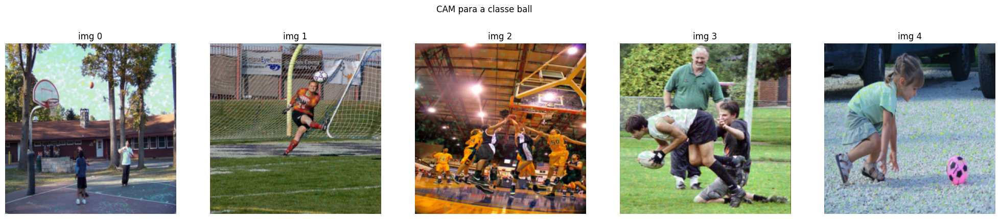

    0 --- true: ball       pred: snow       caption: people playing , basketball ball in air
    1 --- true: ball       pred: ball       caption: A soccer player in a red uniform just kicked a ball .
    2 --- true: ball       pred: man        caption: A group of basketball players jump in the air for the ball .
    3 --- true: ball       pred: dog        caption: Boys playing ball on grass while man in green shirt watches
    4 --- true: ball       pred: snow       caption: The little girl is chasing after her pink soccer ball .





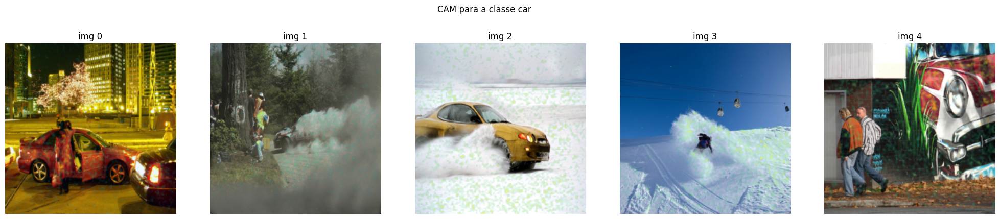

    0 --- true: car        pred: ball       caption: Two people embrace outside of a red car at night in a brightly-lit city .
    1 --- true: car        pred: dog        caption: Six spectators watching a dirt racing car pass by in a cloud of dust .
    2 --- true: car        pred: snow       caption: A yellow car drives across a snowy path .
    3 --- true: car        pred: snow       caption: a skier going down a hill with cable cars in the background
    4 --- true: car        pred: man        caption: Two men walking in front of a grafitti image of a car .





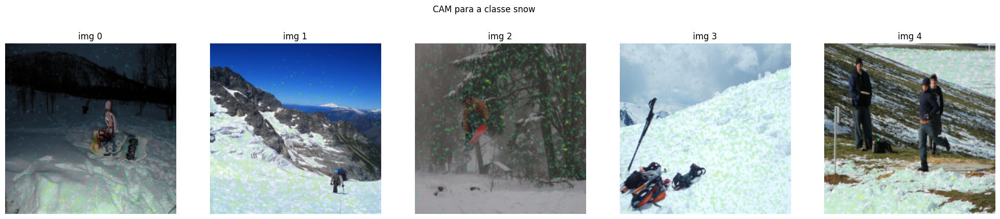

    0 --- true: snow       pred: snow       caption: The girl in the pink hat is dragging a sled through the snow .
    1 --- true: snow       pred: snow       caption: A person in a blue hat climbing up a snow covered mountain .
    2 --- true: snow       pred: water      caption: Snowboarder does stunt on his board in the snow .
    3 --- true: snow       pred: snow       caption: Snowy mountainside with snow gear and poles in forefront .
    4 --- true: snow       pred: snow       caption: Three people in dark clothing stand in a field of melting snow .





In [ ]:
n_perclass = 5
figsize = (5,5)
cam_imgs_per_class = get_cams_per_class(model,train_loader,n_perclass = n_perclass,target_layer='block1')

for class_idx, cams_imgs in enumerate(cam_imgs_per_class):
  fig,axs = plt.subplots(1,5,figsize=(figsize[0]*n_perclass,figsize[1]*1))

  ## mostra as imagens nos ax
  for img_count, (img_np,heatmap,caption,label,pred) in enumerate(cams_imgs):
    ax = axs[img_count]
    ax.imshow(img_np)
    ax.imshow(heatmap)
    ax.set_title(f"img {img_count}")
    ax.axis('off')
  fig.suptitle(f"CAM para a classe {label2class[class_idx]}")
  plt.show()

  ## printa as captions e labels e preds
  for img_count, (img_np,heatmap,caption,label,pred) in enumerate(cams_imgs):
    true_class = label2class[label]
    pred_class = label2class[pred]
    print(f"{img_count:5} --- true: {true_class:10} pred: {pred_class:10} caption: {caption}")
  print("\n\n")
